# NETWORKX

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os 

# I > Data Set processing

## a) Generating a connectivity matrix that we can exploit

In [ ]:
connectivity_ipsi = pd.read_csv("Data83018\\connectivity_ipsi.csv", index_col=0)
connectivity_contra = pd.read_csv("Data83018\\connectivity_contra.csv", index_col=0)

conn_names = [i.split(' (')[0] for i in connectivity_contra.columns]
connectivity_contra.columns = conn_names
connectivity_contra.index = conn_names
connectivity_contra

conn_names = [i.split(' (')[0] for i in connectivity_ipsi.columns]
connectivity_ipsi.columns = conn_names
connectivity_ipsi.index = conn_names
connectivity_ipsi

W = pd.concat([pd.concat([connectivity_ipsi, connectivity_contra], axis=1),
                   pd.concat([connectivity_contra, connectivity_ipsi], axis=1)], axis=0)

col_names_ipsi = ["i" + i for i in conn_names]
col_names_contra = ["c" + i for i in conn_names]
conn_names = col_names_ipsi + col_names_contra
W.columns = conn_names
W.index = conn_names
W

In [ ]:
import pandas as pd
connectivity_ipsi = pd.read_csv("Data83018\\connectivity_ipsi.csv", index_col=0)
connectivity_contra = pd.read_csv("Data83018\\connectivity_contra.csv", index_col=0)

conn_names = [i.split(' (')[0] for i in connectivity_contra.columns]
connectivity_contra.columns = conn_names
connectivity_contra.index = conn_names
connectivity_contra

conn_names = [i.split(' (')[0] for i in connectivity_ipsi.columns]
connectivity_ipsi.columns = conn_names
connectivity_ipsi.index = conn_names
connectivity_ipsi

W = pd.concat([pd.concat([connectivity_ipsi, connectivity_contra], axis=1),
                   pd.concat([connectivity_contra, connectivity_ipsi], axis=1)], axis=0)

col_names_ipsi = ["i" + i for i in conn_names]
col_names_contra = ["c" + i for i in conn_names]
conn_names = col_names_ipsi + col_names_contra
W.columns = conn_names
W.index = conn_names
W

## b)  Generating the coordinate dictionnary

In [ ]:
coordinates = pd.read_excel("Data83018\\Brain Region X-Y-Z Coordinates.xlsx", index_col=0, header=2)
coordinates = coordinates.loc[W.columns.values]
coordinates
dict_of_pos2d={coordinates.index[idx]: (coordinates.iloc[idx]['x'],coordinates.iloc[idx]['z']) for idx in range(0,116)}
dict_of_pos2d

## c) Data exploration, comprehension and flag  of potential artefacts

Text(0.5, 1.0, 'Heatmap of the Adjacency matrix')

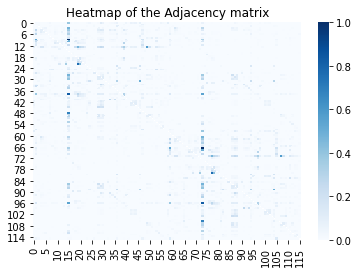

In [95]:
# Visualize matrix with seaborn heatmap (Similar to Fig 1G)
matrixdiagNaN = W.values.copy()
maxi = np.max(matrixdiagNaN)
mini = np.min(matrixdiagNaN)
matrixdiagNaN = (matrixdiagNaN - mini) /(maxi -mini)
np.fill_diagonal(matrixdiagNaN, np.nan) # Send diagonal to NaN for a clearer heatmap
sns.heatmap(matrixdiagNaN, cmap='Blues', cbar=True, square=False)
plt.title("Heatmap of the Adjacency matrix")

<ipython-input-114-5244d8ebb3be>:22: RuntimeWarning: divide by zero encountered in log10
  log10dist = sns.distplot(np.log10(matrixdiagNaN).flatten(), kde=False,


ValueError: cannot convert float NaN to integer

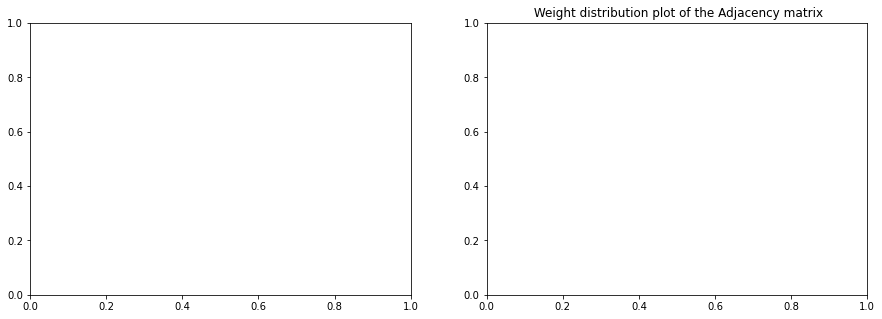

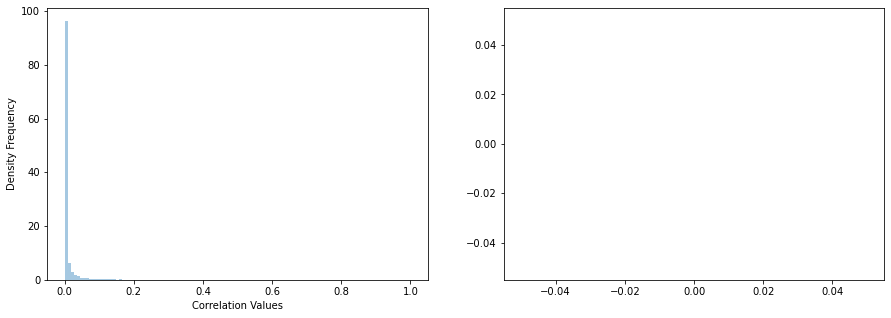

In [114]:
# Visualize matrix with seaborn heatmap (Similar to Fig 1G)
matrixdiagNaN = W.values.copy()
maxi = np.max(matrixdiagNaN)
mini = np.min(matrixdiagNaN)
matrixdiagNaN = (matrixdiagNaN - mini) /(maxi -mini)
bins = np.arange(np.sqrt(len(np.concatenate(matrixdiagNaN))))
bins = (bins - np.min(bins))/np.ptp(bins)
fig, axes = plt.subplots(1,2, figsize=(15,5))
plt.title(" Weight distribution plot of the Adjacency matrix")

# Weight distribution plot
bins = np.arange(np.sqrt(len(np.concatenate(matrixdiagNaN))))
bins = (bins - np.min(bins))/np.ptp(bins)
fig, axes = plt.subplots(1,2, figsize=(15,5))

# Distribution of raw weights
rawdist = sns.distplot(matrixdiagNaN.flatten(), bins=bins, kde=False,
ax=axes[0], norm_hist=True)
rawdist.set(xlabel='Correlation Values', ylabel = 'Density Frequency')

# Probability density of log10
log10dist = sns.distplot(np.log10(matrixdiagNaN).flatten(), kde=False,
                             ax=axes[1], norm_hist=True)
log10dist.set(xlabel='log(weights)')

## II> NetworkX 

## a) First Graph-Test

In [153]:
# Create graph from the matrix
G_gt = nx.from_numpy_matrix(W.values)
type(G_gt)

# Remove self-loops in the graph
G_gt.remove_edges_from(nx.selfloop_edges(G_gt, data=False)) 

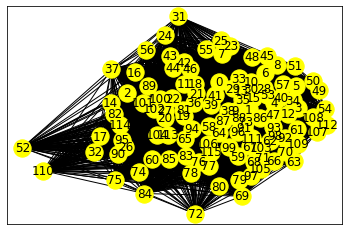

In [163]:
nx.draw_networkx(G_gt, with_labels=True, node_color="yellow")

## b) Computing the Degrees

In [ ]:
#Computing the degrees
for i in range(0,58):
    print(G_gt.degree(nbunch=i, weight="weight"))

## c) Distance

NetworkXError: Node 0 has no position.

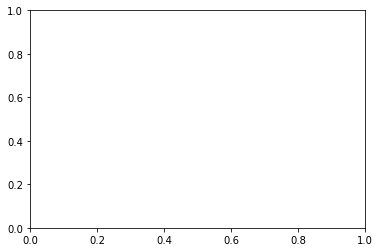

In [411]:
# We calculate the distance as 1-weight
G_gt_distance_dict = {(e1, e2): 1 / abs(weight) for e1, e2, weight in
G_gt.edges(data='weight')}

# Then we need to add it as an attribute of the graph edges
nx.set_edge_attributes(G_gt, values= G_gt_distance_dict, name='distance')

# Compute path length between vertices 1 and 5
nx.dijkstra_path_length(G_gt, source=1, target=5, weight='distance') # only to graph with non negative weight)

# Compute path length between all pairs
nx.all_pairs_dijkstra_path_length(G_gt, weight='distance')

# Compute average path length
nx.average_shortest_path_length(G_gt, weight='distance')

## d) Cliquishness

In [413]:
# Compute the average clustering coefficient of the network
clustering = nx.average_clustering(G_gt, weight='weight')
clustering

0.0048666406030089685

## e) Centralities
 ## Eigenvector centrality

In [ ]:
# Compute eigenvector centrality for graph
eigen_centrality = nx.eigenvector_centrality(G_gt, weight='weight')
eigen_centrality

## closeness

In [ ]:
# Compute closeness centrality for graph using distance
nx.closeness_centrality(G_gt, distance='distance')

## betweeness

In [ ]:
# Compute betweenness centrality for graph
nx.betweenness_centrality(G_gt, weight='distance', normalized=True)

## Minimum Spanning tree

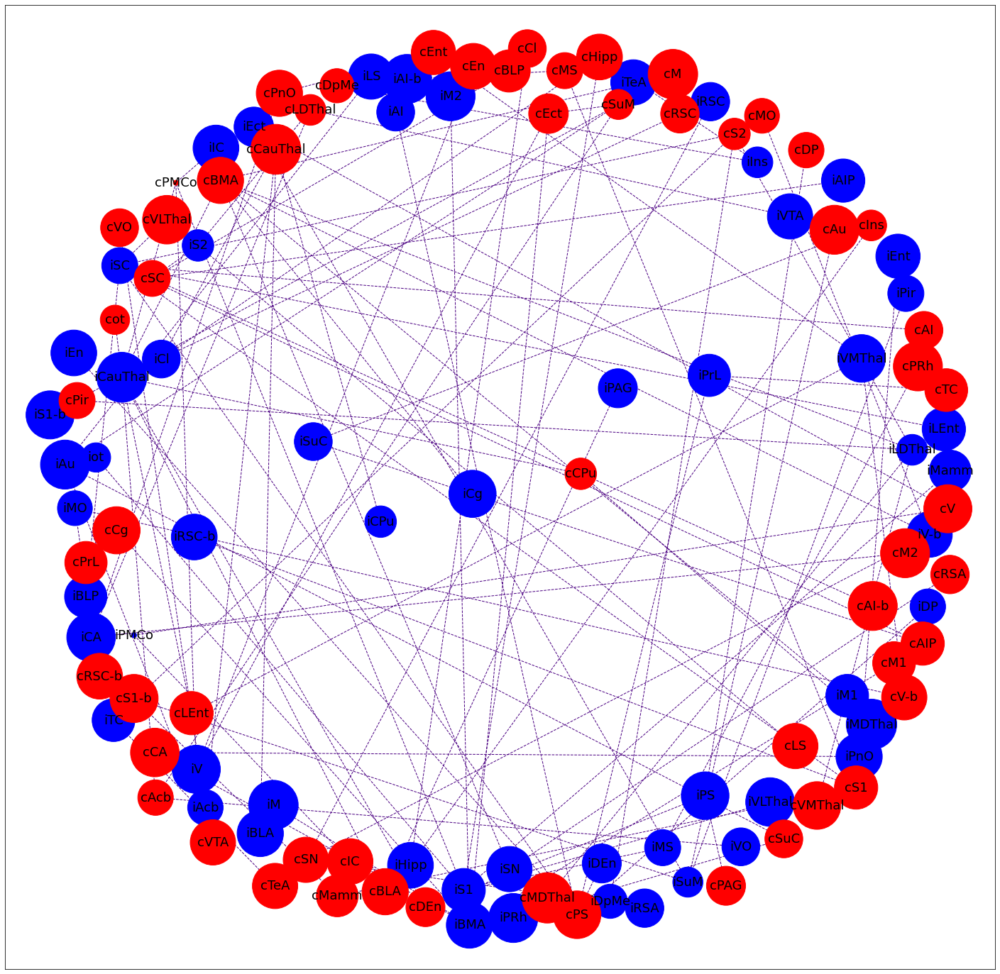

In [409]:
# Compute the minimum spanning tree
plt.figure(figsize=(25,25))
tree = nx.minimum_spanning_tree(G_gt, weight='weight') #CAREFUL for Undirected GRAPH only
pos = nx.spring_layout(a, k=0.50)

node_sizes = [G_gt.degree[i] for i in range(0,116)]
maxi = np.max(node_sizes)
mini = np.min(node_sizes)

node_sizes = (node_sizes-mini)/(maxi-mini) +0.01
node_sizes

# M = G_gt.number_of_edges()
# edge_colors = range(2, M + 2)
# edge_alphas = [(5 + i) / (M + 4) for i in range(M)]
# cmap = plt.cm.plasma


laplacian.columns.values
my_dict ={idx: name  for idx, name in enumerate(laplacian.columns.values)}
my_dict

nx.draw_networkx(tree,pos=pos, labels=my_dict, node_size=node_sizes*5000, with_labels=True, font_size=18, 
                 node_color=np.array(["blue"]*58 + ["Red"]*58), 
                 edge_color="indigo",style="dashed", arrows=True)

## Modularity

In [149]:
!pip install python-louvain
from community import community_louvain 

  Created wheel for python-louvain: filename=python_louvain-0.15-py3-none-any.whl size=9406 sha256=58d617bb1c423c711ddc83199448e47ba4d16bc5f6a759c2cf73b378a07f0ffb
  Stored in directory: c:\users\thoma\appdata\local\pip\cache\wheels\c8\68\21\d04741956802581119d875a0d9fce6895e8f9ffae71223f3e3
Successfully built python-louvain


{0, 1, 2, 3, 4, 5}

In [420]:
# Computing Modularity
part = community_louvain.best_partition(G_gt, weight='weight') ## Louvain algorithm

# Check the number of communities
set(part.values()).union()


dict_values([0, 1, 4, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 4, 4, 0, 1, 1, 1, 1, 0, 0, 0, 4, 4, 0, 0, 0, 0, 4, 0, 1, 0, 4, 0, 1, 1, 1, 0, 0, 0, 0, 0, 4, 1, 0, 0, 0, 0, 4, 0, 3, 0, 0, 1, 3, 2, 4, 2, 2, 2, 2, 3, 4, 2, 2, 2, 2, 2, 2, 3, 4, 4, 2, 2, 2, 2, 2, 4, 3, 4, 4, 4, 3, 3, 3, 4, 4, 3, 2, 3, 4, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 4, 3, 0, 3, 3, 2])

## III> Graph Construction

# 3D but not considering weight or direction

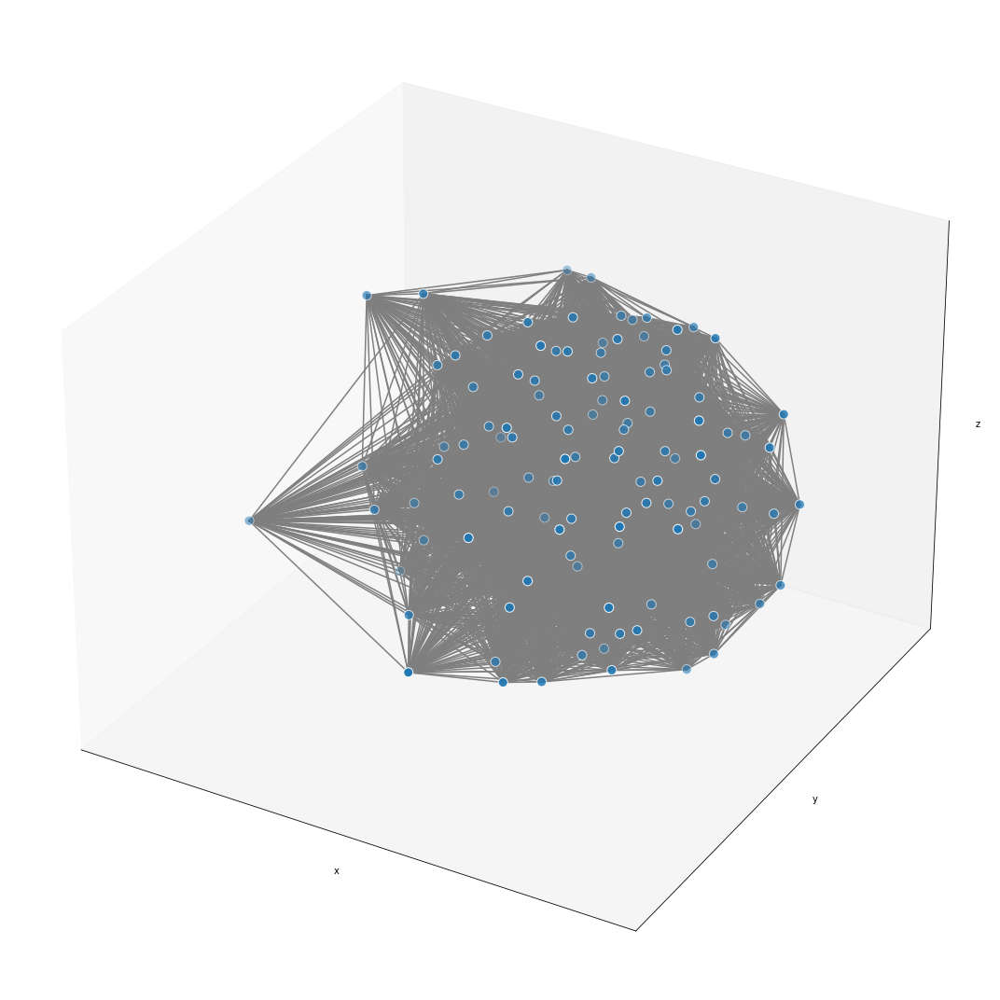

In [175]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create graph from the matrix
G_gt = nx.from_numpy_matrix(W.values)
type(G_gt)

# Remove self-loops in the graph
G_gt.remove_edges_from(nx.selfloop_edges(G_gt, data=False)) 

# 3d spring layout
pos = nx.spring_layout(G_gt, dim=3, seed=None)
# Extract node and edge positions from the layout
node_xyz = np.array([pos[v] for v in sorted(G_gt)])
edge_xyz = np.array([(pos[u], pos[v]) for u, v in G_gt.edges()])

# Create the 3D figure
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection="3d")

# Plot the nodes - alpha is scaled by "depth" automatically
ax.scatter(*node_xyz.T, s=100, ec="w")

# Plot the edges
for vizedge in edge_xyz:
    ax.plot(*vizedge.T, color="tab:gray")


def _format_axes(ax):
    """Visualization options for the 3D axes."""
    # Turn gridlines off
    ax.grid(False)
    # Suppress tick labels
    for dim in (ax.xaxis, ax.yaxis, ax.zaxis):
        dim.set_ticks([])
    # Set axes labels
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")


_format_axes(ax)
fig.tight_layout()
plt.show()

# Different graph types

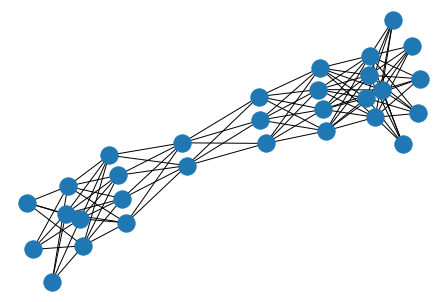

In [181]:
nx.draw_spring(G_gt) #This gives a spring layout of the graph G

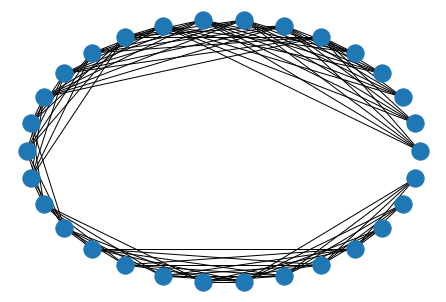

In [182]:
nx.draw_circular(G_gt) #This gives cicular layout of the graph G

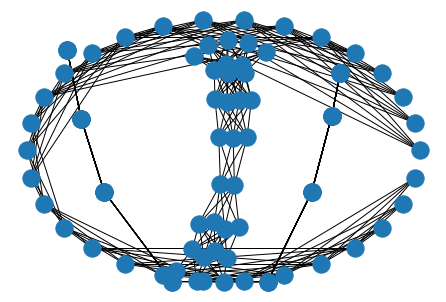

In [180]:
nx.draw_spectral(G_gt) #This gives a spectral 2D layout of the graph G.

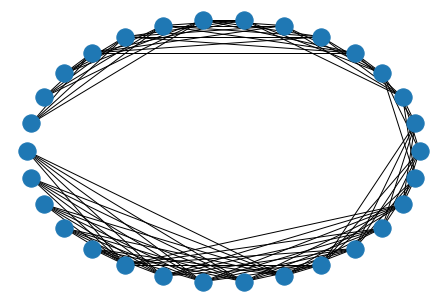

In [183]:
nx.draw_shell(G_gt)

## Plot of the Degree/Rank

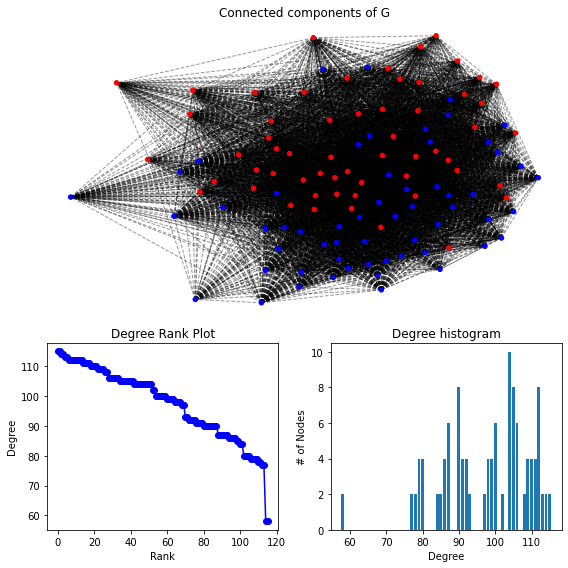

In [331]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

# Create graph from the matrix
G_gt = nx.from_numpy_matrix(W.values)
type(G_gt)

# Remove self-loops in the graph
G_gt.remove_edges_from(nx.selfloop_edges(G_gt, data=False)) 


degree_sequence = sorted([d for n, d in G_gt.degree()], reverse=True)
dmax = max(degree_sequence)

fig = plt.figure("Degree of the adjacency graph", figsize=(8, 8))
# Create a gridspec for adding subplots of different sizes
axgrid = fig.add_gridspec(5, 4)

ax0 = fig.add_subplot(axgrid[0:3, :])
Gcc = G_gt.subgraph(sorted(nx.connected_components(G_gt), key=len, reverse=True)[0])
pos = nx.spring_layout(Gcc)
nx.draw_networkx_nodes(Gcc, pos, ax=ax0, node_size=20, node_color=np.array(["blue"]*58 + ["Red"]*58))
nx.draw_networkx_edges(Gcc, pos, ax=ax0, alpha=0.4, style="dashed")
ax0.set_title("Connected components of G")
ax0.set_axis_off()

ax1 = fig.add_subplot(axgrid[3:, :2])
ax1.plot(degree_sequence, "b-", marker="o")
ax1.set_title("Degree Rank Plot")
ax1.set_ylabel("Degree")
ax1.set_xlabel("Rank")

ax2 = fig.add_subplot(axgrid[3:, 2:])
ax2.bar(*np.unique(degree_sequence, return_counts=True))
ax2.set_title("Degree histogram")
ax2.set_xlabel("Degree")
ax2.set_ylabel("# of Nodes")

fig.tight_layout()
plt.show()

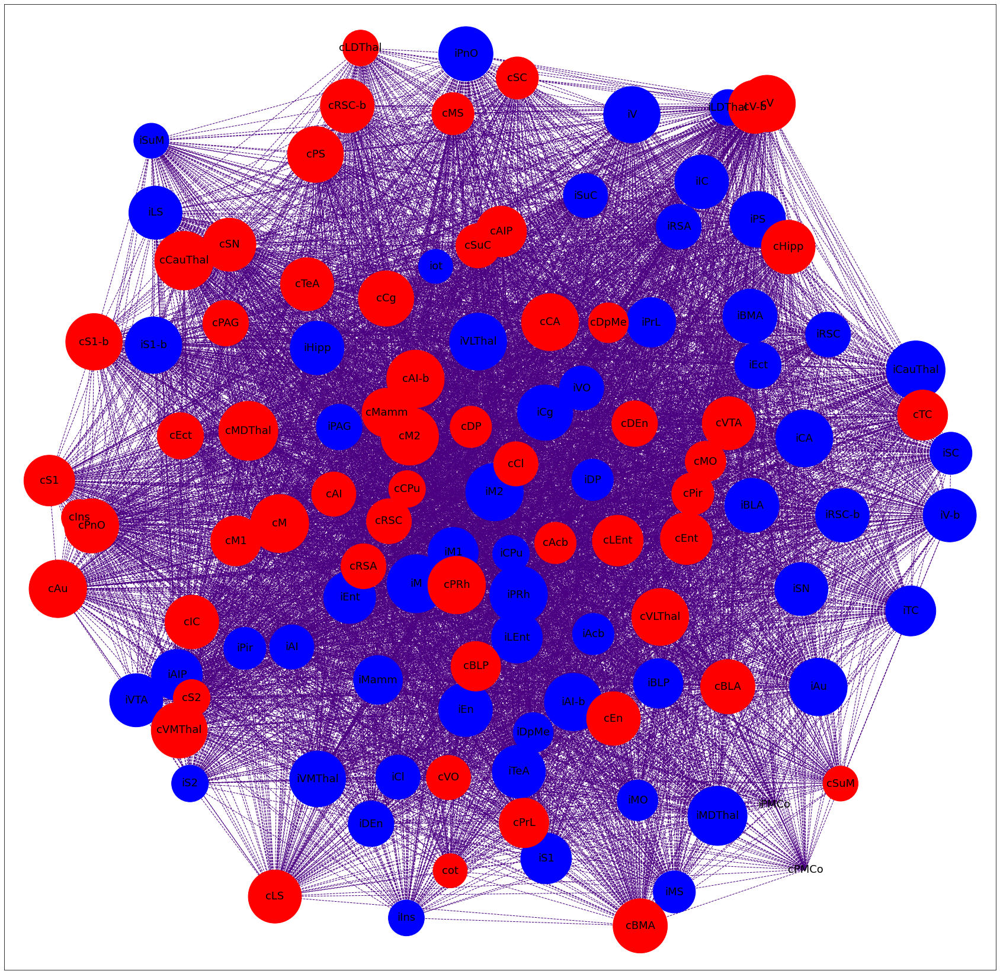

'C:\\Users\\thoma\\Documents\\M1_Neurasmus\\NeuroBIM_M1\\Internship\\GitRepo\\PathoSpreading'

In [398]:
plt.figure(figsize=(30,30))
pos=nx.spring_layout(G_gt, k=1, iterations=50, scale=0.8)
# k controls the distance between the nodes and varies between 0 and 1
# iterations is the number of times simulated annealing is run
# default k =0.1 and iterations=50
laplacian.columns.values
my_dict ={idx: name  for idx, name in enumerate(laplacian.columns.values)}
my_dict

node_sizes = [G_gt.degree[i] for i in range(0,116)]
maxi = np.max(node_sizes)
mini = np.min(node_sizes)

node_sizes = (node_sizes-mini)/(maxi-mini)
node_sizes

M = G_gt.number_of_edges()
edge_colors = range(2, M + 2)
edge_alphas = [(5 + i) / (M + 4) for i in range(M)]
cmap = plt.cm.plasma

nx.draw_networkx(G_gt, pos=pos, node_size=node_sizes*10000, with_labels=True, 
                 labels=my_dict, font_size=18, 
                 node_color=np.array(["blue"]*58 + ["Red"]*58), 
                 edge_color="indigo",style="dashed", arrows=True)

fig.tight_layout()
plt.savefig(".\Graphtest.png", dpi=150)
plt.show()
os.getcwd()

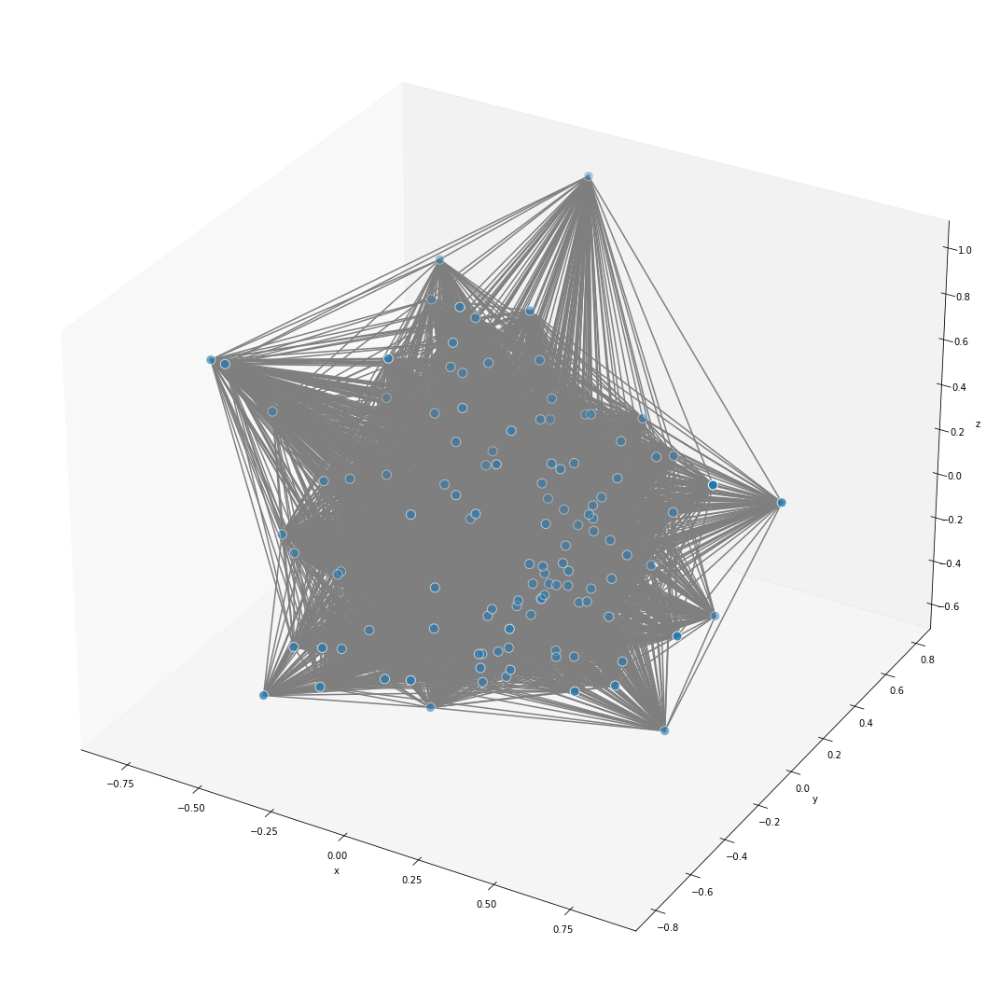

In [382]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# 3d spring layout
pos = nx.spring_layout(G_gt, pos=dict_of_pos, dim=3, seed=None)
# Extract node and edge positions from the layout
node_xyz = np.array([pos[v] for v in sorted(G_gt)])
edge_xyz = np.array([(pos[u], pos[v]) for u, v in G_gt.edges()])

# Create the 3D figure
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection="3d")

# Plot the nodes - alpha is scaled by "depth" automatically
ax.scatter(*node_xyz.T, s=100, ec="w")

# Plot the edges
for vizedge in edge_xyz:
    ax.plot(*vizedge.T, color="tab:gray")


def _format_axes(ax):
    """Visualization options for the 3D axes."""
    # Turn gridlines off
    ax.grid(False)
    # Suppress tick labels
#     for dim in (ax.xaxis, ax.yaxis, ax.zaxis):
#         dim.set_ticks([])
    # Set axes labels
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")


_format_axes(ax)
fig.tight_layout()
plt.show()

## The Graph is directed ==> Any changes?

In [ ]:
import numpy as np

plt.figure(figsize=(25,25))
DG = nx.DiGraph(W)
pos=nx.spring_layout(DG, pos=dict_of_pos2d, k=10.25, dim=2)
node_sizes = [DG.degree[i] for i in W.columns]
maxi = np.max(node_sizes)
mini = np.min(node_sizes)

node_sizes = (node_sizes-mini)/(maxi-mini)+0.01
node_sizes


DG = nx.DiGraph(W)
nx.draw_networkx(DG, node_size=node_sizes*100, with_labels=True, font_size=18, 
                 node_color=np.array(["blue"]*58 + ["Red"]*58), 
                 edge_color="indigo", arrows=True, pos=pos)

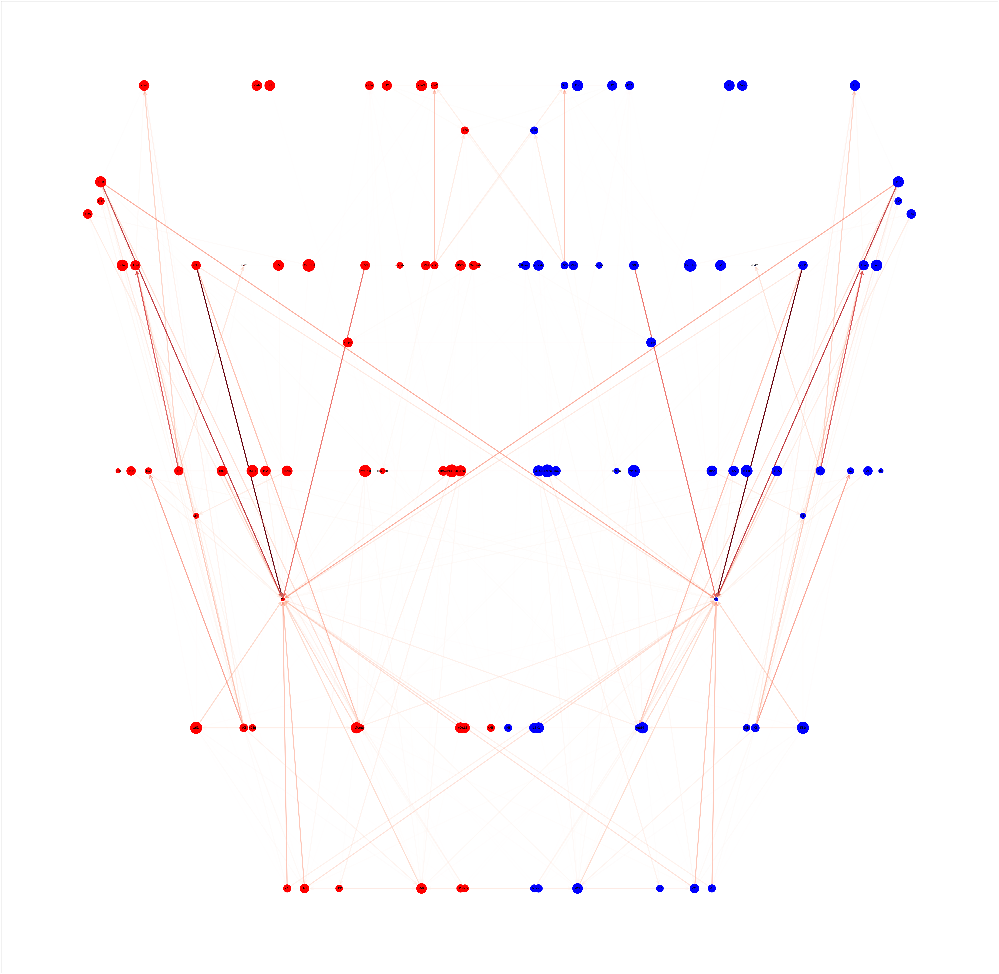

In [236]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
plt.figure(figsize=(100,100))
DG = nx.DiGraph(W)

#Threshold 
elarge = [(u,v) for (u,v,d) in DG.edges(data=True) if d['weight'] >0.5]
esmall = [(u,v) for (u,v,d) in DG.edges(data=True) if d['weight'] <=0.5]

#Position
# pos = nx.spring_layout(DG, pos=dict_of_pos, k=20)# positions for all nodes

#Node size proportional to the number of edges
node_sizes = [DG.degree[i] for i in W.columns]
maxi = np.max(node_sizes)
mini = np.min(node_sizes)

node_sizes = (node_sizes-mini)/(maxi-mini)+0.01
node_sizes
# Edges colors using weight between two nodes
weights_elarge = [d['weight'] for (u,v,d) in DG.edges(data=True) if d['weight'] >0.5]

weights_esmall = [d['weight'] for (u,v,d) in DG.edges(data=True) if d['weight'] <=0.1]

# nodes
nx.draw_networkx_nodes(DG,dict_of_pos2d,node_size=node_sizes*5000, node_color=np.array(["blue"]*58 + ["Red"]*58))

# edges
# nx.draw_networkx_edges(DG,dict_of_pos2d,node_size=node_sizes*5000,edgelist=esmall,
#                     width=6,alpha=0.1,edge_color="blue",arrowstyle="->", arrowsize=40)
elarge_edges = nx.draw_networkx_edges(DG,dict_of_pos2d,node_size=node_sizes*5000,edgelist=elarge,
                    width=6, edge_color=weights_elarge, edge_cmap=plt.cm.Reds, arrowstyle="->", arrowsize=40)

# labels
nx.draw_networkx_labels(DG,dict_of_pos2d,font_size=15,font_family='sans-serif')

# set alpha value for each edge
    #Need first to normalize the elarge_weight values
max_w = np.max(weights_elarge)
min_w = np.min(weights_elarge)
weight_elarge_normalized = (weights_elarge - min_w) / (max_w - min_w)

for i in range(len(weights_elarge)):
    elarge_edges[i].set_alpha(weight_elarge_normalized[i])

pc = mpl.collections.PatchCollection(edges, cmap=plt.cm.Reds)
pc.set_array(weights_elarge)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

plt.colorbar(pc, cax=cax, ticks=[0.5, 1])
ax = plt.gca()
plt.savefig("weighted_directed_graph.png", dpi=72)

plt.show()



## Using SpringLayout

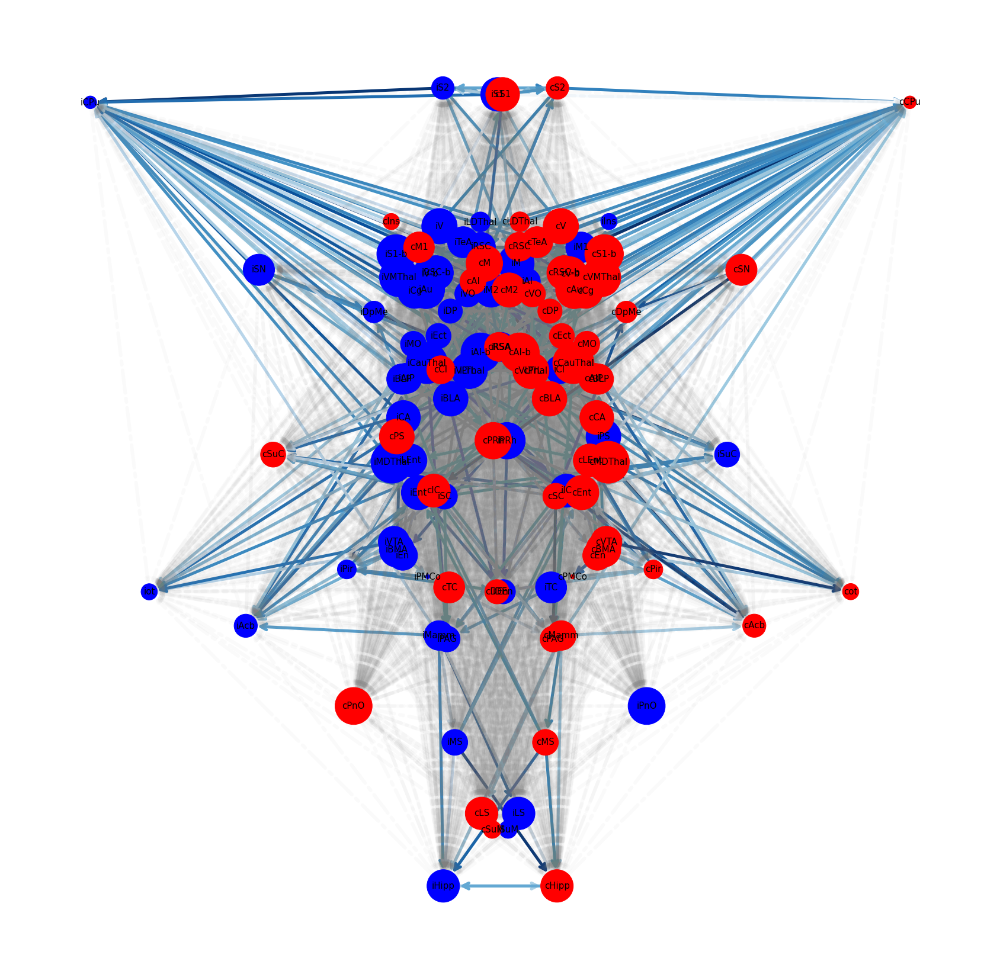

In [95]:
plt.figure(figsize=(30,30))
DG = nx.DiGraph(W)
cmap = plt.get_cmap('Blues')

#Threshold 
elarge = [(u,v) for (u,v,d) in DG.edges(data=True) if d['weight'] >0.5]
esmall = [(u,v) for (u,v,d) in DG.edges(data=True) if d['weight'] <=0.5]

#Position
pos = nx.spring_layout(DG, pos=dict_of_pos2d, k=20)# positions for all nodes

#Node size proportional to the number of edges
node_sizes = [DG.degree[i] for i in W.columns]
maxi = np.max(node_sizes)
mini = np.min(node_sizes)

node_sizes = (node_sizes-mini)/(maxi-mini)+0.01
node_sizes
# Edges colors
colors = cmap(node_sizes)

# nodes
nx.draw_networkx_nodes(DG,pos,node_size=node_sizes*5000, node_color=np.array(["blue"]*58 + ["Red"]*58))

# edges
nx.draw_networkx_edges(DG,pos,node_size=node_sizes*5000,edgelist=elarge,
                    width=5, edge_color=colors, arrowstyle="->", arrowsize=25)
nx.draw_networkx_edges(DG,pos,node_size=node_sizes*5000,edgelist=esmall,
                    width=6,alpha=0.04,edge_color='grey',style='-.')

# labels
nx.draw_networkx_labels(DG,pos,font_size=15,font_family='sans-serif')
plt.savefig("weighted_directed_graph.png", dpi=100)
plt.axis('off')
plt.show()

In [373]:
!pip install mayavi
import networkx as nx
import numpy as np
from mayavi import mlab

# some graphs to try
# H=nx.krackhardt_kite_graph()
# H=nx.Graph();H.add_edge('a','b');H.add_edge('a','c');H.add_edge('a','d')
# H=nx.grid_2d_graph(4,5)
H = nx.cycle_graph(20)

# reorder nodes from 0,len(G)-1
G = nx.convert_node_labels_to_integers(H)
# 3d spring layout
pos = nx.spring_layout(G, dim=3)
# numpy array of x,y,z positions in sorted node order
xyz = np.array([pos[v] for v in sorted(G)])
# scalar colors
scalars = np.array(list(G.nodes())) + 5

pts = mlab.points3d(
    xyz[:, 0],
    xyz[:, 1],
    xyz[:, 2],
    scalars,
    scale_factor=0.1,
    scale_mode="none",
    colormap="Blues",
    resolution=20,
)

pts.mlab_source.dataset.lines = np.array(list(G.edges()))
tube = mlab.pipeline.tube(pts, tube_radius=0.01)
mlab.pipeline.surface(tube, color=(0.8, 0.8, 0.8))
mlab.show()

^C


ModuleNotFoundError: No module named 'mayavi'

## Distribution of weights

20
7132


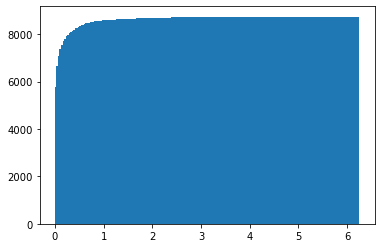

In [235]:
test = [d['weight'] for (u,v,d) in DG.edges(data=True)]
test.sort(reverse=False)
import matplotlib.pyplot as plt
import seaborn as sns
plt.hist(test, cumulative=True, bins=200)
icr=0
for i in test:
    if i > 3:
        icr = icr +1
print(icr)
# weight <0.1 ==> 7132
# weight <0.2 ==> 7748
# weight <0.3 ==> 8010
# weight <0.5 ==> 8300
# weight >0.5 ==> 432
# weight >1   ==> 156
# weight >1.5 ==> 90
# weight >2   ==> 48
# weight >2   ==> 20
test
k=0
for i in range(0,len(W.values)):
    for j in range(0,len(W.values)):
        if 0< W.values[i][j] < 0.1:
            k=k+1
print(k)

## Jitter

In [486]:
# implementing a jitter
def rand_jitter_z(df):
    Data = pd.DataFrame(df.values,index=df.index, columns=df.columns)
    stdev = .12 * (np.max(df['z'].values) - np.min(df['z'].values))
    for idx in range(0,58):
        stored = np.random.randn(1)
        Data.iloc[idx]['z'] = Data.iloc[idx]['z'] + stored *stdev
        Data.iloc[idx+58]['z'] = Data.iloc[idx+58]['z'] + stored *stdev
    return Data

def rand_jitter_x(df):
    Data = pd.DataFrame(df.values,index=df.index, columns=df.columns)
    stdev = .07 * (np.max(df['x'].values) - np.min(df['x'].values))
    for idx in range(0,58):
        stored = np.random.randn(1)
        Data.iloc[idx]['x'] = Data.iloc[idx]['x'] + stored *stdev
        Data.iloc[idx+58]['x'] = Data.iloc[idx+58]['x'] + stored *stdev
    return Data

coordinates = pd.read_excel("Data83018\\Brain Region X-Y-Z Coordinates.xlsx", index_col=0, header=2)
coordinates = coordinates.loc[W.columns.values]
coordinates

df = coordinates.copy()
df
jitter_df_x = rand_jitter_x(df)
jitter_df_z = rand_jitter_z(df)

dict_jitter_x_z={coordinates.index[idx]: (coordinates.iloc[idx]['x'],jitter_df_z.iloc[idx]['z']) for idx in range(0,116)}
dict_jitter_x_z

{'iCg': (6150, 4513),
 'iAcb': (7300, 4038),
 'iTC': (6350, 6338),
 'iAI': (8150, 2943),
 'iAI-b': (9200, 5317),
 'iAIP': (9950, 6771),
 'iMDThal': (6250, 5655),
 'iDpMe': (6850, 8213),
 'iAu': (10050, 8086),
 'iBLP': (9200, 8676),
 'iBLA': (8900, 6962),
 'iBMA': (8150, 7838),
 'iCA': (8400, 6203),
 'iCl': (8650, 4663),
 'iPMCo': (8650, 7676),
 'iCPu': (8200, 6034),
 'iPnO': (6600, 9405),
 'iHipp': (7450, 7930),
 'iEct': (10300, 8283),
 'iLEnt': (9900, 9376),
 'iEnt': (9800, 9742),
 'iDEn': (8550, 5034),
 'iEn': (9400, 5557),
 'iIC': (7000, 9605),
 'iLDThal': (7050, 5357),
 'iCauThal': (7900, 8616),
 'iLS': (6100, 4905),
 'iMamm': (6000, 7769),
 'iM1': (7950, 2847),
 'iM2': (6600, 3486),
 'iM': (7350, 4102),
 'iSC': (6450, 7756),
 'iMS': (5800, 4451),
 'iDP': (7550, 3283),
 'iMO': (6100, 2948),
 'iVO': (6600, 2730),
 'iPAG': (6100, 8370),
 'iPS': (8350, 8885),
 'iPRh': (10300, 9140),
 'iPir': (9200, 6653),
 'iPrL': (6150, 4140),
 'iVLThal': (6150, 6802),
 'iRSC': (6350, 6905),
 'iRSC-b

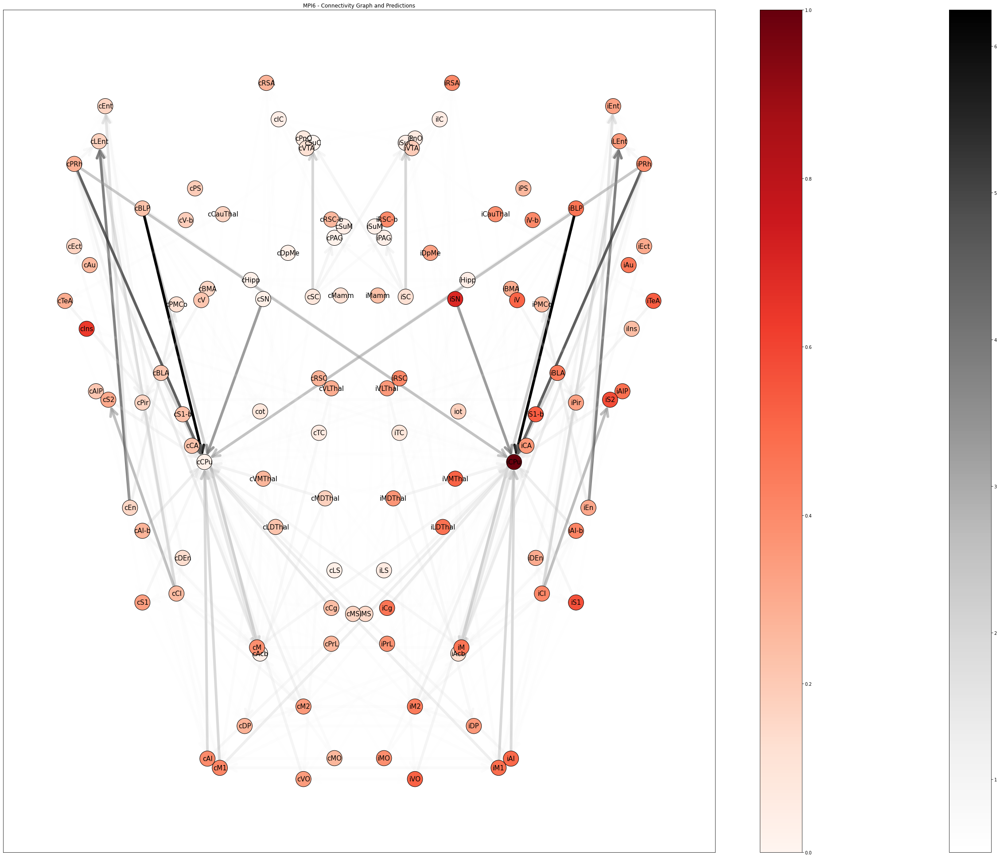

In [494]:
import os
import seaborn as sns
# Extracting the predictions values
data_cpu = pd.read_csv('../output/predicted_pathology_iCPu.csv')
data_cpu
# Normalization using MPI6 - Seed CPu
max_CPu= np.max(data_cpu['MPI6'])
min_CPu = np.min(data_cpu['MPI6'])

data_cpu['MPI6'] = (data_cpu['MPI6'] - min_CPu) / (max_CPu - min_CPu)
data_cpu['MPI3'] = (data_cpu['MPI3'] - min_CPu) / (max_CPu - min_CPu)
data_cpu['MPI1'] = (data_cpu['MPI1'] - min_CPu) / (max_CPu - min_CPu)
data_cpu
cmap = plt.get_cmap('Reds')
cmap_node_mpi1 = cmap(data_cpu['MPI1'].values)
cmap_node_mpi3 = cmap(data_cpu['MPI3'].values)
cmap_node_mpi6 = cmap(data_cpu['MPI6'].values)

fig = plt.figure(figsize=(45,35))
DG = nx.DiGraph(W)

#Threshold 
elarge = [(u,v) for (u,v,d) in DG.edges(data=True) if d['weight'] >0.5]
esmall = [(u,v) for (u,v,d) in DG.edges(data=True) if d['weight'] <=0.5]

#Position
# pos = nx.spring_layout(DG, pos=dict_of_pos, k=20)# positions for all nodes

#Node colors


# Edges colors using weight between two nodes
weights_elarge = [d['weight'] for (u,v,d) in DG.edges(data=True) if d['weight'] >0.5]

weights_esmall = [d['weight'] for (u,v,d) in DG.edges(data=True) if d['weight'] <=0.1]

# nodes
nodes = nx.draw_networkx_nodes(DG,dict_jitter_x_z,node_size=1200, node_color=cmap_node_mpi6, edgecolors="black")


# edges
# nx.draw_networkx_edges(DG,dict_of_pos2d,node_size=900,edgelist=esmall,
#                     width=6,alpha=0.1,edge_color="blue",arrowstyle="->", arrowsize=40)
elarge_edges = nx.draw_networkx_edges(DG,dict_jitter_x_z,node_size=900,edgelist=elarge,
                    width=6, edge_color=weights_elarge, edge_cmap=plt.cm.Greys, arrowstyle="->", arrowsize=40)

# labels
nx.draw_networkx_labels(DG,dict_jitter_x_z,font_size=15,font_family='sans-serif')

# set alpha value for each edge
    #Need first to normalize the elarge_weight values
max_w = np.max(weights_elarge)
min_w = np.min(weights_elarge)
weight_elarge_normalized = (weights_elarge - min_w) / (max_w - min_w)

for i in range(len(weights_elarge)):
    elarge_edges[i].set_alpha(weight_elarge_normalized[i])
pc = mpl.collections.PatchCollection(elarge_edges, cmap=plt.cm.Greys)
pc.set_array(weights_elarge)
plt.colorbar(pc)
plt.title("Weight")


pc_2 = mpl.collections.PatchCollection(elarge_edges, cmap=plt.cm.Reds)
pc_2.set_array(data_cpu['MPI6'].values)
plt.colorbar(pc_2)
plt.title("MPI6 - Connectivity Graph and Predictions")


ax = plt.gca()
plt.savefig("weighted_directed_graph_mpi6.png", dpi=72)

plt.show()